In [ ]:
import cv2
from google.colab import drive
drive.mount('/content/drive')
from google.colab import files
from google.colab.patches import cv2_imshow
import numpy as np

Mounted at /content/drive


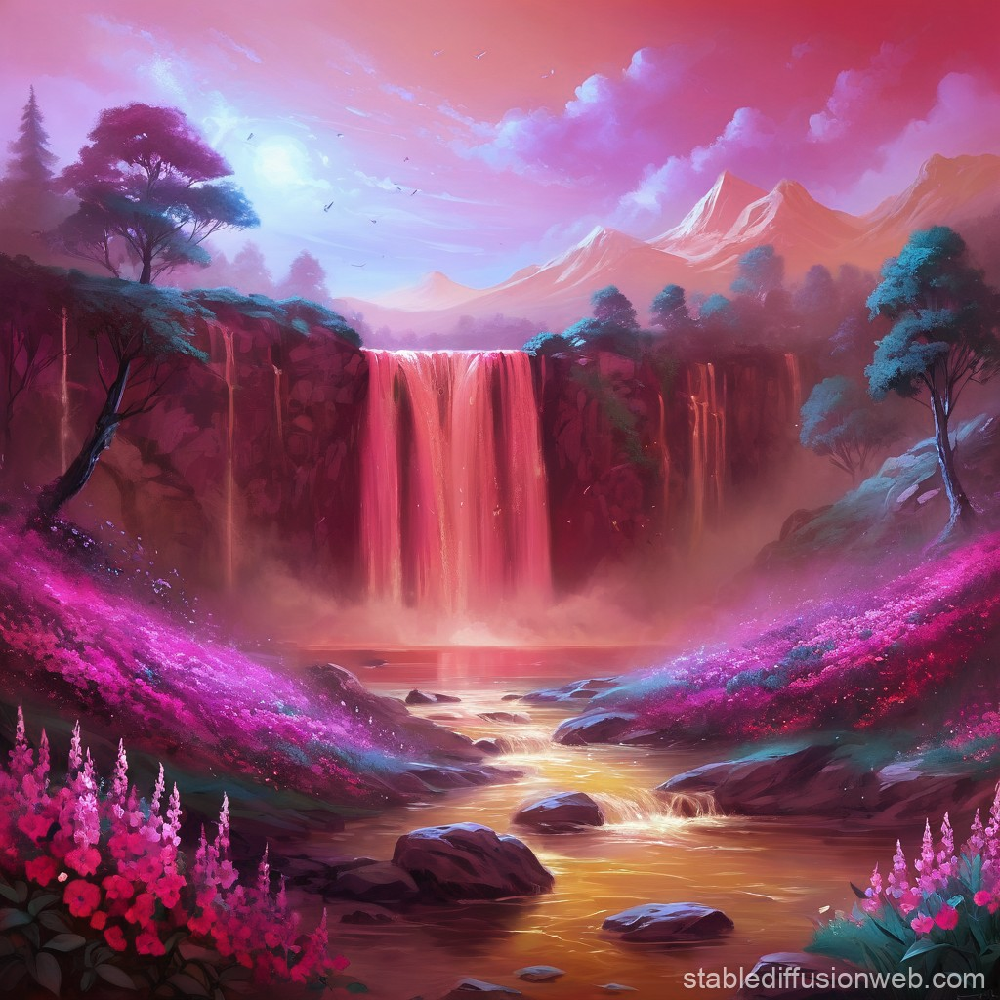

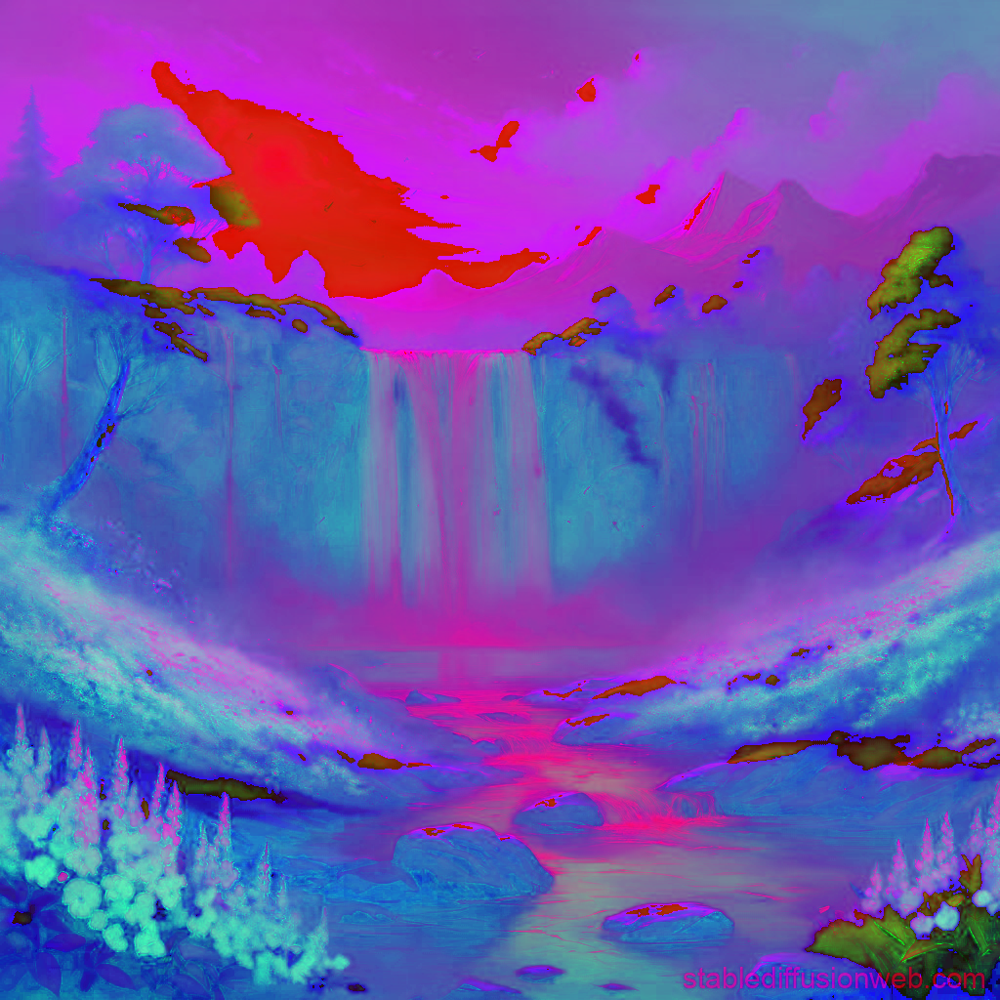

In [ ]:

# Function to convert RGB to HSI
def rgb_to_hsi(image):
    # Normalize the RGB values to the range [0, 1]
    image = image / 255.0
    r, g, b = cv2.split(image)

    # Calculate the intensity
    intensity = (r + g + b) / 3.0

    # Calculate the saturation
    min_rgb = np.minimum(np.minimum(r, g), b)
    saturation = 1 - (3 / (r + g + b + 1e-6) * min_rgb)
    saturation[intensity == 0] = 0  # Avoid division by zero

    # Calculate the hue
    numerator = 0.5 * ((r - g) + (r - b))
    denominator = np.sqrt((r - g)**2 + (r - b) * (g - b)) + 1e-6  # Avoid division by zero
    theta = np.arccos(numerator / denominator)  # Angle in radians

    hue = np.where(b > g, 2 * np.pi - theta, theta)  # Adjust hue for blue channel
    hue = hue / (2 * np.pi)  # Normalize hue to the range [0, 1]

    # Merge channels back into an HSI image
    hsi_image = cv2.merge((hue, saturation, intensity))
    return hsi_image

# Path to the image in Google Drive
image_path = '/content/drive/MyDrive/n.jpg'  # Update this with your actual path

# Read the image from the drive
rgb_image = cv2.imread(image_path)
rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

# Convert to HSI
hsi_image = rgb_to_hsi(rgb_image)

# Display the original and HSI images using cv2_imshow
cv2_imshow(rgb_image)  # Display the original RGB image

# To display HSI image, convert the channels back for visualization (RGB space)
# Normalize HSI to a displayable format
hsi_image_display = np.zeros_like(rgb_image)
hsi_image_display[:, :, 0] = hsi_image[:, :, 0] * 255  # Hue (scaled to 255)
hsi_image_display[:, :, 1] = hsi_image[:, :, 1] * 255  # Saturation (scaled to 255)
hsi_image_display[:, :, 2] = hsi_image[:, :, 2] * 255  # Intensity (scaled to 255)

cv2_imshow(hsi_image_display)  # Display the HSI image

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


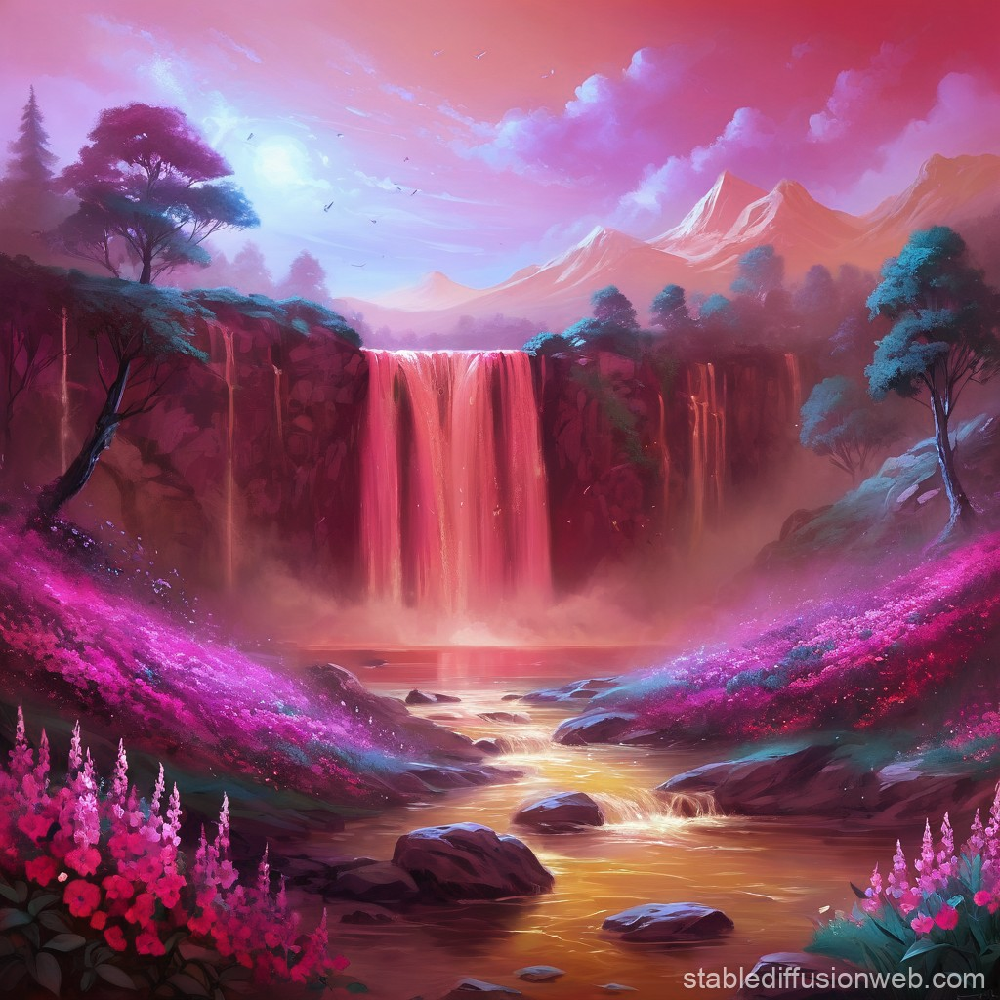

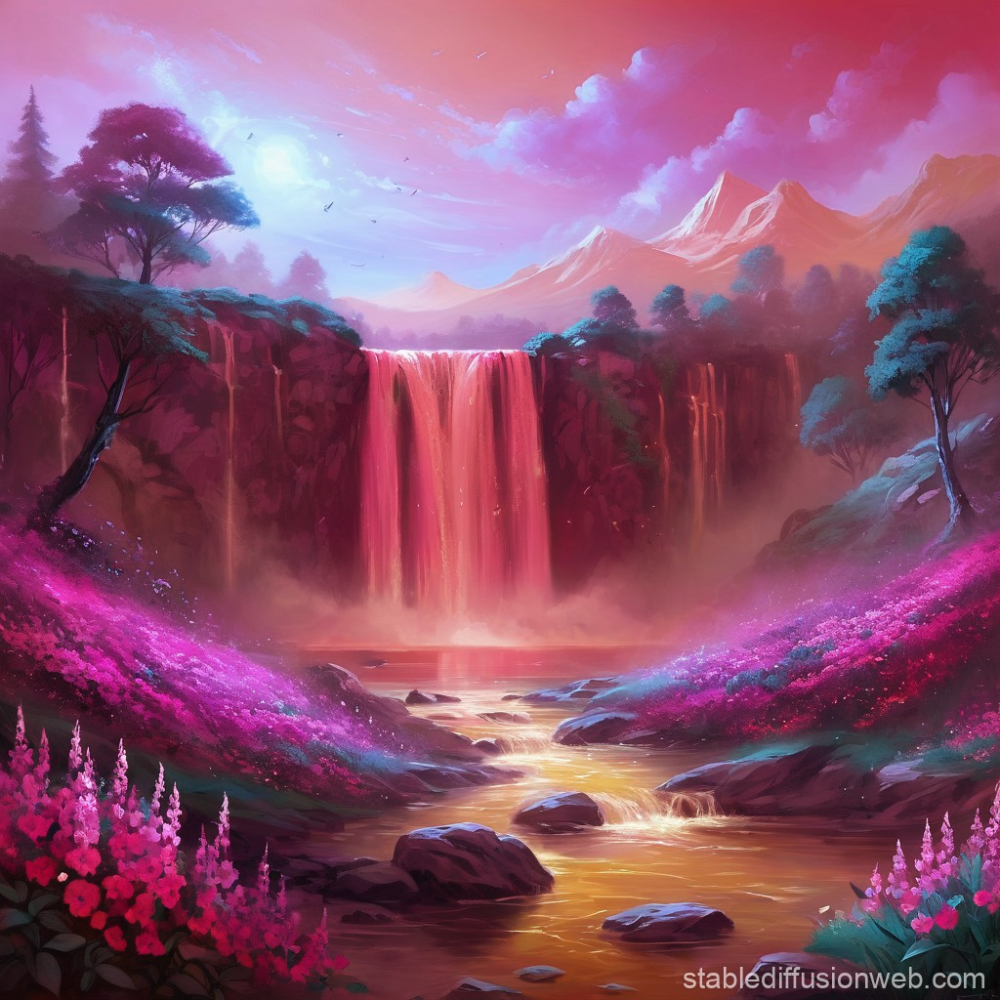

In [ ]:
import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow

# Mount Google Drive
drive.mount('/content/drive')

# Function to convert RGB to HSI
def rgb_to_hsi(image):
    # Normalize the RGB values to the range [0, 1]
    image = image / 255.0
    r, g, b = cv2.split(image)

    # Calculate the intensity
    intensity = (r + g + b) / 3.0

    # Calculate the saturation
    min_rgb = np.minimum(np.minimum(r, g), b)
    saturation = 1 - (3 / (r + g + b + 1e-6) * min_rgb)
    saturation[intensity == 0] = 0  # Avoid division by zero

    # Calculate the hue
    numerator = 0.5 * ((r - g) + (r - b))
    denominator = np.sqrt((r - g)**2 + (r - b) * (g - b)) + 1e-6  # Avoid division by zero
    theta = np.arccos(numerator / denominator)  # Angle in radians

    hue = np.where(b > g, 2 * np.pi - theta, theta)  # Adjust hue for blue channel
    hue = hue / (2 * np.pi)  # Normalize hue to the range [0, 1]

    # Merge channels back into an HSI image
    hsi_image = cv2.merge((hue, saturation, intensity))
    return hsi_image

# Function to convert HSI to RGB
def hsi_to_rgb(hsi_image):
    # Split the HSI channels
    h, s, i = cv2.split(hsi_image)
    h = h * 2 * np.pi  # Convert hue from [0, 1] to [0, 2π]

    # Initialize the R, G, and B channels
    r = np.zeros_like(h)
    g = np.zeros_like(h)
    b = np.zeros_like(h)

    # Sector 1: 0 <= H < 2π/3
    idx = (h < 2 * np.pi / 3)
    b[idx] = i[idx] * (1 - s[idx])
    r[idx] = i[idx] * (1 + s[idx] * np.cos(h[idx]) / np.cos(np.pi / 3 - h[idx]))
    g[idx] = 3 * i[idx] - (r[idx] + b[idx])

    # Sector 2: 2π/3 <= H < 4π/3
    idx = (h >= 2 * np.pi / 3) & (h < 4 * np.pi / 3)
    h_shifted = h[idx] - 2 * np.pi / 3
    r[idx] = i[idx] * (1 - s[idx])
    g[idx] = i[idx] * (1 + s[idx] * np.cos(h_shifted) / np.cos(np.pi / 3 - h_shifted))
    b[idx] = 3 * i[idx] - (r[idx] + g[idx])

    # Sector 3: 4π/3 <= H < 2π
    idx = (h >= 4 * np.pi / 3)
    h_shifted = h[idx] - 4 * np.pi / 3
    g[idx] = i[idx] * (1 - s[idx])
    b[idx] = i[idx] * (1 + s[idx] * np.cos(h_shifted) / np.cos(np.pi / 3 - h_shifted))
    r[idx] = 3 * i[idx] - (g[idx] + b[idx])

    # Merge the channels and scale back to [0, 255]
    rgb_image = cv2.merge((r, g, b))
    rgb_image = np.clip(rgb_image * 255.0, 0, 255).astype(np.uint8)
    return rgb_image

# Path to the image in Google Drive
image_path = '/content/drive/MyDrive/n.jpg'  # Update with your image path in Google Drive

# Read the image from the drive
rgb_image = cv2.imread(image_path)
rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

# Convert to HSI
hsi_image = rgb_to_hsi(rgb_image)

# Convert back to RGB from HSI
reconstructed_rgb = hsi_to_rgb(hsi_image)

# Display the original RGB image using cv2_imshow
cv2_imshow(rgb_image)  # Display the original RGB image

# Display the reconstructed RGB image using cv2_imshow
cv2_imshow(reconstructed_rgb)  # Display the reconstructed RGB image


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


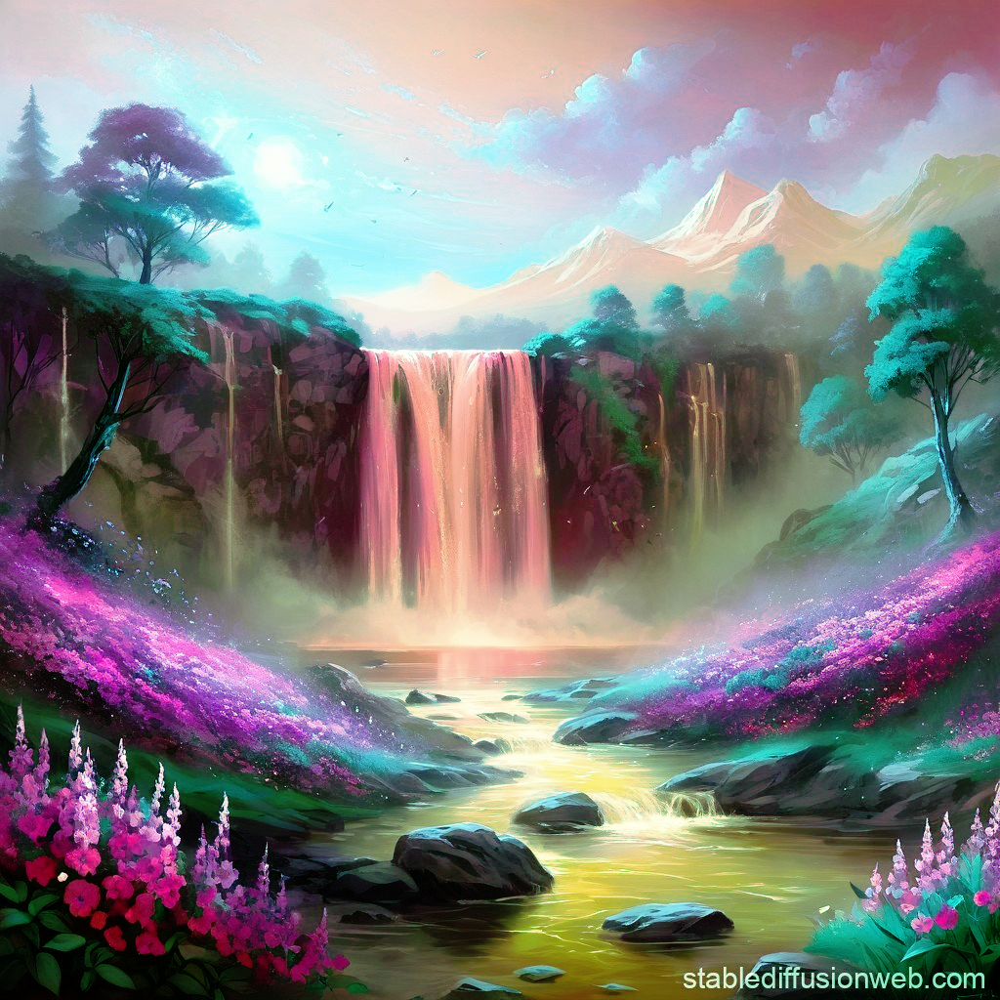

In [ ]:
import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Mount Google Drive to access the files
drive.mount('/content/drive')

# Function to convert RGB to HSI
def rgb_to_hsi(image):
    image = image / 255.0  # Normalize the image to the range [0, 1]
    r, g, b = cv2.split(image)

    # Intensity (I)
    intensity = (r + g + b) / 3.0

    # Saturation (S)
    min_rgb = np.minimum(np.minimum(r, g), b)
    saturation = 1 - (3 / (r + g + b + 1e-6) * min_rgb)
    saturation[intensity == 0] = 0  # Avoid division by zero

    # Hue (H)
    numerator = 0.5 * ((r - g) + (r - b))
    denominator = np.sqrt((r - g)**2 + (r - b) * (g - b)) + 1e-6
    theta = np.arccos(numerator / denominator)

    hue = np.where(b > g, 2 * np.pi - theta, theta)  # Adjust for blue channel
    hue = hue / (2 * np.pi)  # Normalize hue to [0, 1]

    hsi_image = cv2.merge((hue, saturation, intensity))
    return hsi_image

# Function to convert HSI to RGB
def hsi_to_rgb(hsi_image):
    h, s, i = cv2.split(hsi_image)
    h = h * 2 * np.pi  # Convert hue to [0, 2π]

    r, g, b = np.zeros_like(h), np.zeros_like(h), np.zeros_like(h)

    # Sector 1: 0 <= H < 2π/3
    idx = (h < 2 * np.pi / 3)
    b[idx] = i[idx] * (1 - s[idx])
    r[idx] = i[idx] * (1 + s[idx] * np.cos(h[idx]) / np.cos(np.pi / 3 - h[idx]))
    g[idx] = 3 * i[idx] - (r[idx] + b[idx])

    # Sector 2: 2π/3 <= H < 4π/3
    idx = (h >= 2 * np.pi / 3) & (h < 4 * np.pi / 3)
    h_shifted = h[idx] - 2 * np.pi / 3
    r[idx] = i[idx] * (1 - s[idx])
    g[idx] = i[idx] * (1 + s[idx] * np.cos(h_shifted) / np.cos(np.pi / 3 - h_shifted))
    b[idx] = 3 * i[idx] - (r[idx] + g[idx])

    # Sector 3: 4π/3 <= H < 2π
    idx = (h >= 4 * np.pi / 3)
    h_shifted = h[idx] - 4 * np.pi / 3
    g[idx] = i[idx] * (1 - s[idx])
    b[idx] = i[idx] * (1 + s[idx] * np.cos(h_shifted) / np.cos(np.pi / 3 - h_shifted))
    r[idx] = 3 * i[idx] - (g[idx] + b[idx])

    rgb_image = cv2.merge((r, g, b))
    return np.clip(rgb_image * 255.0, 0, 255).astype(np.uint8)

# Manual Histogram Equalization Function
def manual_histogram_equalization_with_pdf_cdf(channel):
    flat = channel.flatten()

    hist, bins = np.histogram(flat, bins=256, range=[0, 256])

    pdf = hist / hist.sum()

    cdf = pdf.cumsum()

    cdf_normalized = cdf * 255.0

    equalized = np.interp(flat, bins[:-1], cdf_normalized)

    return equalized.reshape(channel.shape).astype(np.uint8)

# Histogram Equalization on RGB Image
def histogram_equalization_rgb_manual_with_pdf_cdf(image):
    r, g, b = cv2.split(image)

    r_eq = manual_histogram_equalization_with_pdf_cdf(r)
    g_eq = manual_histogram_equalization_with_pdf_cdf(g)
    b_eq = manual_histogram_equalization_with_pdf_cdf(b)

    return cv2.merge((r_eq, g_eq, b_eq))

# Path to the image in Google Drive
image_path = '/content/drive/MyDrive/n.jpg'  # Update with the correct path

# Read the image from the drive
rgb_image = cv2.imread(image_path)
rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

# Convert to HSI
hsi_image = rgb_to_hsi(rgb_image)

# Convert back to RGB from HSI
reconstructed_rgb = hsi_to_rgb(hsi_image)

# Perform manual histogram equalization on the reconstructed RGB image
equalized_rgb_manual = histogram_equalization_rgb_manual_with_pdf_cdf(reconstructed_rgb)

# Display only the manually histogram equalized image
cv2_imshow(equalized_rgb_manual)  # Display the manually histogram-equalized RGB image


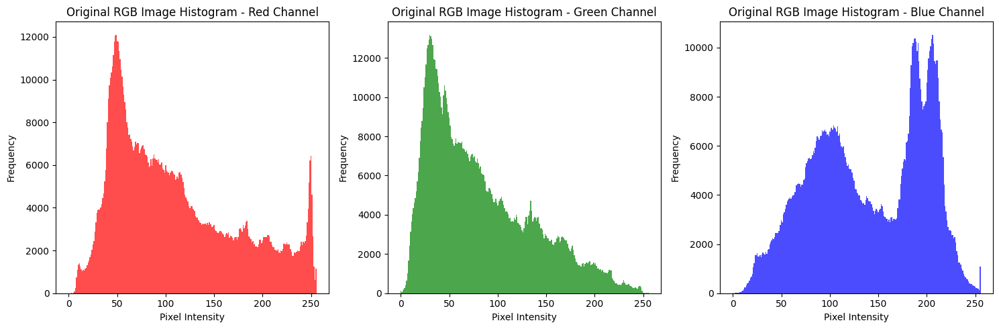

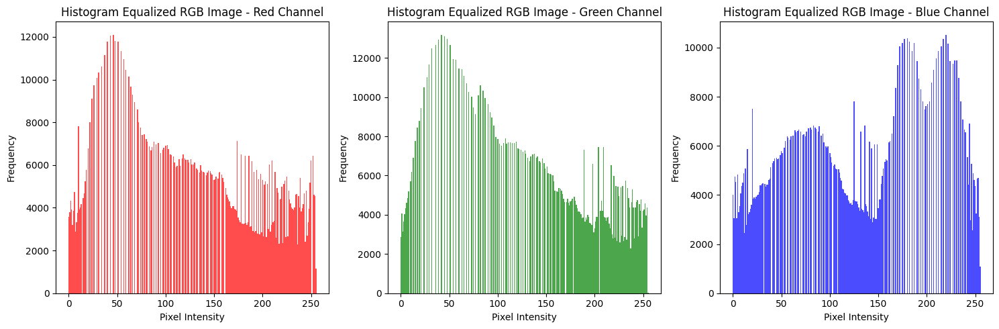

In [ ]:

# Function to plot histograms for the RGB channels of an image
def plot_rgb_histograms(image, title="RGB Histogram"):
    r, g, b = cv2.split(image)
    hist_r, bins_r = np.histogram(r.flatten(), bins=256, range=[0, 256])
    hist_g, bins_g = np.histogram(g.flatten(), bins=256, range=[0, 256])
    hist_b, bins_b = np.histogram(b.flatten(), bins=256, range=[0, 256])

    # Plot histograms for each channel
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.bar(bins_r[:-1], hist_r, width=1, color='red', alpha=0.7)
    plt.title(f"{title} - Red Channel")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.subplot(1, 3, 2)
    plt.bar(bins_g[:-1], hist_g, width=1, color='green', alpha=0.7)
    plt.title(f"{title} - Green Channel")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.subplot(1, 3, 3)
    plt.bar(bins_b[:-1], hist_b, width=1, color='blue', alpha=0.7)
    plt.title(f"{title} - Blue Channel")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

# Path to the image in Google Drive (update with the correct path)
image_path = '/content/drive/MyDrive/n.jpg'  # Replace with your image path

# Read the image from the drive
rgb_image = cv2.imread(image_path)
rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

# Perform histogram equalization on the RGB image
equalized_rgb_manual = histogram_equalization_rgb_manual_with_pdf_cdf(rgb_image)

# Plot histograms for the original RGB image
plot_rgb_histograms(rgb_image, title="Original RGB Image Histogram")

# Plot histograms for the histogram-equalized RGB image
plot_rgb_histograms(equalized_rgb_manual, title="Histogram Equalized RGB Image")

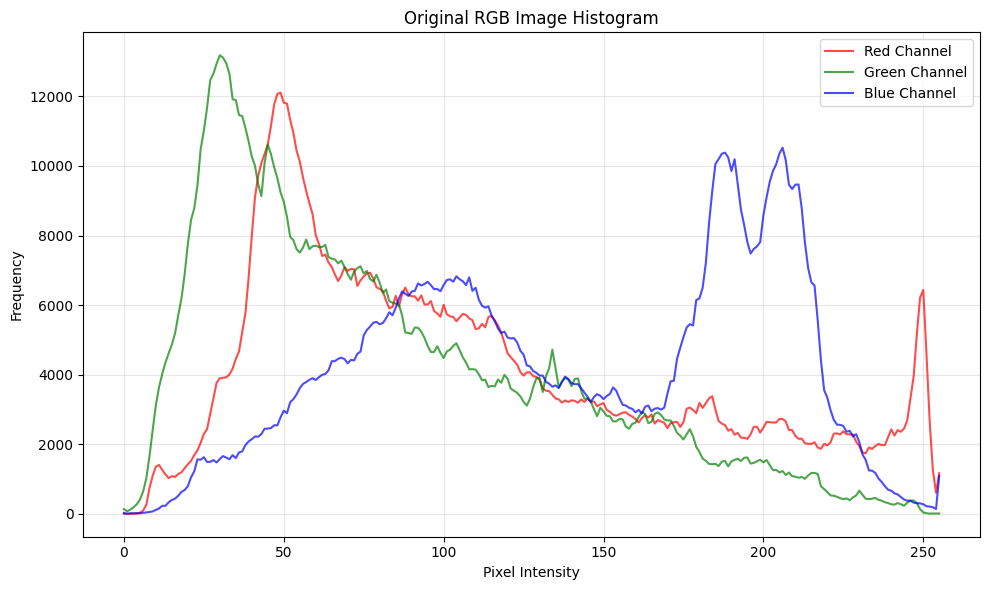

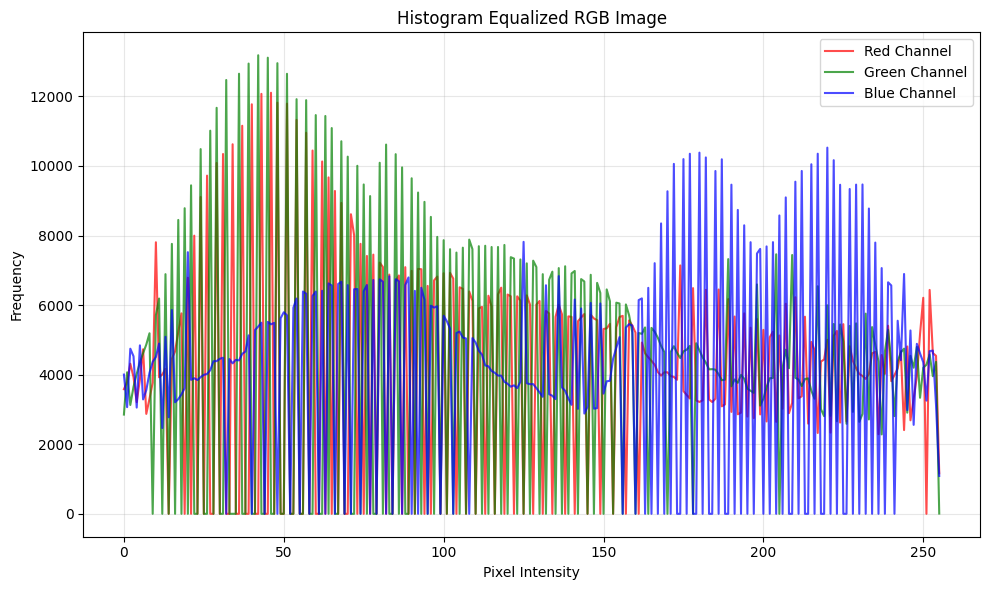

In [ ]:
# Function to perform manual histogram equalization with PDF and CDF for a single channel
def manual_histogram_equalization_with_pdf_cdf(channel):
    flat = channel.flatten()
    hist, bins = np.histogram(flat, bins=256, range=[0, 256])
    pdf = hist / hist.sum()  # Normalize histogram to get probabilities
    cdf = pdf.cumsum()
    cdf_normalized = cdf * 255.0
    equalized = np.interp(flat, bins[:-1], cdf_normalized)
    return equalized.reshape(channel.shape).astype(np.uint8)

# Function to apply manual histogram equalization on an RGB image
def histogram_equalization_rgb_manual_with_pdf_cdf(image):
    r, g, b = cv2.split(image)
    r_eq = manual_histogram_equalization_with_pdf_cdf(r)
    g_eq = manual_histogram_equalization_with_pdf_cdf(g)
    b_eq = manual_histogram_equalization_with_pdf_cdf(b)
    return cv2.merge((r_eq, g_eq, b_eq))

# Function to plot combined histograms for the RGB channels of an image
def plot_combined_rgb_histograms(image, title="RGB Histogram"):
    r, g, b = cv2.split(image)

    # Compute histograms for each channel
    hist_r, bins_r = np.histogram(r.flatten(), bins=256, range=[0, 256])
    hist_g, bins_g = np.histogram(g.flatten(), bins=256, range=[0, 256])
    hist_b, bins_b = np.histogram(b.flatten(), bins=256, range=[0, 256])

    # Plot combined histograms for all three channels
    plt.figure(figsize=(10, 6))
    plt.plot(bins_r[:-1], hist_r, color='red', label='Red Channel', alpha=0.7)
    plt.plot(bins_g[:-1], hist_g, color='green', label='Green Channel', alpha=0.7)
    plt.plot(bins_b[:-1], hist_b, color='blue', label='Blue Channel', alpha=0.7)

    # Labels and title
    plt.title(f"{title}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# Path to the image in Google Drive (update with the correct path)
image_path = '/content/drive/MyDrive/n.jpg'  # Replace with your image path

# Read the image from the drive
rgb_image = cv2.imread(image_path)
rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

# Perform histogram equalization on the RGB image
equalized_rgb_manual = histogram_equalization_rgb_manual_with_pdf_cdf(rgb_image)

# Plot combined histograms for the original RGB image
plot_combined_rgb_histograms(rgb_image, title="Original RGB Image Histogram")

# Plot combined histograms for the histogram-equalized RGB image
plot_combined_rgb_histograms(equalized_rgb_manual, title="Histogram Equalized RGB Image")